In [1]:
import visual_behavior_glm.GLM_analysis_tools as gat
import visual_behavior_glm.GLM_visualization_tools as gvt
import visual_behavior_glm.GLM_params as glm_params
import pandas as pd
from multiprocessing import Pool
import numpy as np
from visual_behavior.data_access import loading, utilities, from_lims
import os
pd.set_option('display.max_columns', 500)
import matplotlib.pyplot as plt
import seaborn as sns
from visual_behavior_glm.glm import GLM
import seaborn as sns

import visual_behavior.utilities as vbu
import visual_behavior.plotting as vbp

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [3]:
%matplotlib notebook

In [4]:
version = '16_events_all_L2_optimize_by_session'

In [5]:
r = gat.retrieve_results({'glm_version': '16_events_all_L2_optimize_by_session'}, results_type='summary')

In [6]:
r[['ophys_experiment_id','session_type','cre_line']].drop_duplicates()

,ophys_experiment_id,session_type,cre_line
0,853362773,OPHYS_5_images_B_passive,Vip-IRES-Cre
690,949723715,OPHYS_5_images_B_passive,Vip-IRES-Cre
2314,877057344,OPHYS_4_images_B,Vip-IRES-Cre
2916,957759564,OPHYS_4_images_B,Sst-IRES-Cre
4150,993369861,OPHYS_3_images_A,Slc17a7-IRES2-Cre
...,...,...,...
4092872,982183920,OPHYS_4_images_A,Sst-IRES-Cre
4093556,994790553,OPHYS_6_images_A,Slc17a7-IRES2-Cre
4115900,892799212,OPHYS_4_images_B,Slc17a7-IRES2-Cre
4135712,807753334,OPHYS_3_images_A,Slc17a7-IRES2-Cre


In [7]:
rp = gat.build_pivoted_results_summary('adj_fraction_change_from_full',results_summary=r)

In [8]:
run_params = glm_params.load_run_json(version)

In [9]:
weights_df = gat.build_weights_df(run_params,rp)

100%|██████████| 1079/1079 [02:35<00:00,  6.95it/s]


In [10]:
weights_df

,cell_specimen_id,ophys_experiment_id,intercept_weights,time_weights,licks_weights,hits_weights,misses_weights,false_alarms_weights,correct_rejects_weights,omissions_weights,running_weights,pupil_weights,face_motion_PC_0_weights,face_motion_PC_1_weights,face_motion_PC_2_weights,face_motion_PC_3_weights,face_motion_PC_4_weights,image0_weights,image1_weights,image2_weights,image3_weights,image4_weights,image5_weights,image6_weights,image7_weights,model_bias_weights,model_task0_weights,model_omissions1_weights,model_timing1D_weights,passive_change_weights,identifier,Full,all-images,beh_model,behavioral,cognitive,correct_rejects,expectation,face_motion_PC_0,face_motion_PC_1,face_motion_PC_2,face_motion_PC_3,face_motion_PC_4,face_motion_energy,false_alarms,hits,image0,image1,image2,image3,image4,image5,image6,image7,intercept,licking,licks,misses,model_bias,model_omissions1,model_task0,model_timing1D,omissions,passive_change,pupil,pupil_and_omissions,pupil_and_running,running,running_and_omissions,single-all-images,single-beh_model,single-behavioral,single-cognitive,single-correct_rejects,single-expectation,single-face_motion_PC_0,single-face_motion_PC_1,single-face_motion_PC_2,single-face_motion_PC_3,single-face_motion_PC_4,single-face_motion_energy,single-false_alarms,single-hits,single-image0,single-image1,single-image2,single-image3,single-image4,single-image5,single-image6,single-image7,single-licking,single-licks,single-misses,single-model_bias,single-model_omissions1,single-model_task0,single-model_timing1D,single-omissions,single-passive_change,single-pupil,single-pupil_and_omissions,single-pupil_and_running,single-running,single-running_and_omissions,single-task,single-time,single-visual,task,time,visual,variance_explained_full,cell_roi_id,glm_version,ophys_session_id,equipment_name,donor_id,full_genotype,mouse_id,reporter_line,driver_line,sex,age_in_days,foraging_id,cre_line,indicator,session_number,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,behavior_session_id,ophys_container_id,project_code,container_workflow_state,experiment_workflow_state,session_name,isi_experiment_id,imaging_depth,targeted_structure,published_at,date_of_acquisition,session_type,session_tags,failure_tags,model_outputs_available,location
0,1086668247,1000743008,[3.8280937430104204e-05],[1.710637566097628e-05],"[8.795248393762622e-06, 2.5052351798052124e-06...","[-4.479283676834618e-06, -5.5997390258399665e-...","[-1.1947772749790997e-06, -1.8659270366951869e...","[-6.123369603857915e-07, -9.45553246421127e-07...","[-7.707164051332127e-07, -6.577146652616257e-0...","[-3.728429720078385e-06, -3.488665907189488e-0...","[-2.458182998657481e-07, -3.8918006227685765e-...","[-7.372390153286428e-08, -3.9101020746842835e-...","[2.2576711327578843e-06, 4.982427503324004e-07...","[-1.4742474991264991e-06, -2.212089744151214e-...","[1.8939157058400914e-06, -2.5811178118062513e-...","[-1.1277981185178806e-06, -1.4771818516493263e...","[-2.5107263905970305e-06, -1.885851935513962e-...","[-3.039744928427557e-06, 2.142838422694861e-05...","[-3.3004968934286373e-06, -4.362189561860489e-...","[2.3818721156280818e-05, 2.740173064498646e-05...","[-3.1763013537302742e-06, -5.033233773142148e-...","[-2.8933313366764266e-06, -3.594843189352588e-...","[-4.248750577072808e-06, -6.410495786408734e-0...","[-2.639836390962448e-06, -3.4498035570868146e-...","[-3.142506381011091e-06, -4.620064344375104e-0...","[6.78570245704088e-06, 5.8211998630361025e-06,...","[3.0040708667315677e-07, 2.572477324497302e-07...","[-3.7165034211260863e-07, -2.688821981113684e-...","[-9.284413986991559e-07, -8.767037242342512e-0...",NaN,1000743008_1086668247,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.00

In [11]:
weights_cols = [col for col in weights_df.columns if '_weights' in col]
weights_cols

['intercept_weights',
 'time_weights',
 'licks_weights',
 'hits_weights',
 'misses_weights',
 'false_alarms_weights',
 'correct_rejects_weights',
 'omissions_weights',
 'running_weights',
 'pupil_weights',
 'face_motion_PC_0_weights',
 'face_motion_PC_1_weights',
 'face_motion_PC_2_weights',
 'face_motion_PC_3_weights',
 'face_motion_PC_4_weights',
 'image0_weights',
 'image1_weights',
 'image2_weights',
 'image3_weights',
 'image4_weights',
 'image5_weights',
 'image6_weights',
 'image7_weights',
 'model_bias_weights',
 'model_task0_weights',
 'model_omissions1_weights',
 'model_timing1D_weights',
 'passive_change_weights']

In [12]:
weights_df[weights_cols[0]].values

array([list([3.8280937430104204e-05]), list([-0.0012251051569751412]),
       list([0.0005324587039382415]), ..., list([-0.0002725206585630587]),
       list([0.060272020000134305]), list([-3.892226749003624e-05])],
      dtype=object)

In [13]:
w = gat.get_weights_matrix_from_mongo(ophys_experiment_id = 888879671, glm_version=version)
w

<xarray.DataArray (weights: 317, cell_specimen_id: 92)>
array([[ 1.59344247e-02, -2.41401720e-03, -1.92455490e-04, ...,
        -3.97110241e-04,  4.85104158e-05,  1.52755634e-03],
       [-2.93984991e-03,  3.18310851e-03,  2.00613316e-03, ...,
        -2.44470060e-04,  2.32509792e-04, -2.17934293e-03],
       [-1.09046407e-02, -6.46245876e-04,  9.52742951e-05, ...,
        -1.32000855e-05, -2.35108202e-04, -1.05160766e-03],
       ...,
       [-2.08318394e-01, -1.57886693e-03,  1.49104849e-04, ...,
         5.79562549e-03,  2.49658835e-04,  6.26785933e-03],
       [-2.04009736e-01, -1.67961879e-03,  3.56945919e-05, ...,
         5.25976074e-03, -4.41671622e-05,  7.75265206e-03],
       [-1.18993113e-01, -1.37928813e-03, -4.62468101e-05, ...,
         2.68323984e-03, -5.18482468e-05,  4.83397776e-03]])
Coordinates:
  * weights           (weights) <U20 'intercept_0' 'time_0' ... 'image7_5'
  * cell_specimen_id  (cell_specimen_id) int64 1086510728 ... 1086503356

In [14]:
%%time
def get_weights_df(ophys_experiment_id, version='16_events_all_L2_optimize_by_session'):  
    w = gat.get_weights_matrix_from_mongo(ophys_experiment_id = int(ophys_experiment_id), glm_version=version)
    df = pd.DataFrame(
        w.values.T,
        columns = w['weights'].values,
        index = w['cell_specimen_id'].values
    ).reset_index()
    df.rename(columns = {'index': 'cell_specimen_id'}, inplace=True)
    df['ophys_experiment_id'] = ophys_experiment_id

    df.set_index(['ophys_experiment_id', 'cell_specimen_id'], inplace=True)
    
    return df


CPU times: user 6 µs, sys: 1 µs, total: 7 µs
Wall time: 19.3 µs


In [15]:
%%time
df = get_weights_df(ophys_experiment_id = 888879671)

CPU times: user 24.7 ms, sys: 7.63 ms, total: 32.3 ms
Wall time: 127 ms


In [16]:
with Pool(32) as pool:
    dfs = pool.map(get_weights_df, r.query('equipment_name == "MESO.1"')['ophys_experiment_id'].unique())

In [17]:
all_weights = pd.concat(dfs, sort=True).fillna(0)
all_weights.reset_index()['ophys_experiment_id'].unique()

array([ 853362773,  949723715,  877057344,  957759564,  993369861,
        990681009,  891108765,  947798783,  947798777,  891108760,
        990681013,  947798775,  949723713,  947798771,  990681008,
        993619369,  881949068,  989610987,  947798779,  881949081,
        949723709,  949723717,  886587166,  882968568,  945586431,
        888876941,  942596355,  885146243,  945586440,  945586429,
        991852002,  990681010,  986518893,  948689196,  945586438,
        882968564,  882551939,  885146239,  882551950,  951213207,
        951213211,  886587174,  945586433,  951213209,  990400782,
        882551935,  993619364,  951213203,  945586425,  942596349,
        886587162,  989213060,  942596357,  991852003,  989610989,
        992084625,  990681012,  989610985,  948689192,  994082673,
        990681006,  986518880,  989610990,  989610988,  993891843,
        990400779,  990400778,  877057349,  972233189,  992084628,
        992620393,  993619371,  993891846,  990400780,  993619

In [18]:
all_weights.reset_index()

,ophys_experiment_id,cell_specimen_id,correct_rejects_-1,correct_rejects_-10,correct_rejects_-11,correct_rejects_-2,correct_rejects_-3,correct_rejects_-4,correct_rejects_-5,correct_rejects_-6,correct_rejects_-7,correct_rejects_-8,correct_rejects_-9,correct_rejects_0,correct_rejects_1,correct_rejects_10,correct_rejects_11,correct_rejects_12,correct_rejects_13,correct_rejects_14,correct_rejects_15,correct_rejects_16,correct_rejects_17,correct_rejects_18,correct_rejects_19,correct_rejects_2,correct_rejects_20,correct_rejects_21,correct_rejects_22,correct_rejects_23,correct_rejects_24,correct_rejects_25,correct_rejects_26,correct_rejects_27,correct_rejects_28,correct_rejects_29,correct_rejects_3,correct_rejects_30,correct_rejects_31,correct_rejects_32,correct_rejects_33,correct_rejects_34,correct_rejects_35,correct_rejects_36,correct_rejects_37,correct_rejects_38,correct_rejects_39,correct_rejects_4,correct_rejects_40,correct_rejects_41,correct_rejects_42,correct_rejects_43,correct_rejects_44,correct_rejects_45,correct_rejects_46,correct_rejects_47,correct_rejects_48,correct_rejects_49,correct_rejects_5,correct_rejects_6,correct_rejects_7,correct_rejects_8,correct_rejects_9,face_motion_PC_0_-1,face_motion_PC_0_-10,face_motion_PC_0_-11,face_motion_PC_0_-2,face_motion_PC_0_-3,face_motion_PC_0_-4,face_motion_PC_0_-5,face_motion_PC_0_-6,face_motion_PC_0_-7,face_motion_PC_0_-8,face_motion_PC_0_-9,face_motion_PC_0_0,face_motion_PC_0_1,face_motion_PC_0_10,face_motion_PC_0_2,face_motion_PC_0_3,face_motion_PC_0_4,face_motion_PC_0_5,face_motion_PC_0_6,face_motion_PC_0_7,face_motion_PC_0_8,face_motion_PC_0_9,face_motion_PC_1_-1,face_motion_PC_1_-10,face_motion_PC_1_-11,face_motion_PC_1_-2,face_motion_PC_1_-3,face_motion_PC_1_-4,face_motion_PC_1_-5,face_motion_PC_1_-6,face_motion_PC_1_-7,face_motion_PC_1_-8,face_motion_PC_1_-9,face_motion_PC_1_0,face_motion_PC_1_1,face_motion_PC_1_10,face_motion_PC_1_2,face_motion_PC_1_3,face_motion_PC_1_4,face_motion_PC_1_5,face_motion_PC_1_6,face_motion_PC_1_7,face_motion_PC_1_8,face_motion_PC_1_9,face_motion_PC_2_-1,face_motion_PC_2_-10,face_motion_PC_2_-11,face_motion_PC_2_-2,face_motion_PC_2_-3,face_motion_PC_2_-4,face_motion_PC_2_-5,face_motion_PC_2_-6,face_motion_PC_2_-7,face_motion_PC_2_-8,face_motion_PC_2_-9,face_motion_PC_2_0,face_motion_PC_2_1,face_motion_PC_2_10,face_motion_PC_2_2,face_motion_PC_2_3,face_motion_PC_2_4,face_motion_PC_2_5,face_motion_PC_2_6,face_motion_PC_2_7,face_motion_PC_2_8,face_motion_PC_2_9,face_motion_PC_3_-1,face_motion_PC_3_-10,face_motion_PC_3_-11,face_motion_PC_3_-2,face_motion_PC_3_-3,face_motion_PC_3_-4,face_motion_PC_3_-5,face_motion_PC_3_-6,face_motion_PC_3_-7,face_motion_PC_3_-8,face_motion_PC_3_-9,face_motion_PC_3_0,face_motion_PC_3_1,face_motion_PC_3_10,face_motion_PC_3_2,face_motion_PC_3_3,face_motion_PC_3_4,face_motion_PC_3_5,face_motion_PC_3_6,face_motion_PC_3_7,face_motion_PC_3_8,face_motion_PC_3_9,face_motion_PC_4_-1,face_motion_PC_4_-10,face_motion_PC_4_-11,face_motion_PC_4_-2,face_motion_PC_4_-3,face_motion_PC_4_-4,face_motion_PC_4_-5,face_motion_PC_4_-6,face_motion_PC_4_-7,face_motion_PC_4_-8,face_motion_PC_4_-9,face_motion_PC_4_0,face_motion_PC_4_1,face_motion_PC_4_10,face_motion_PC_4_2,face_motion_PC_4_3,face_motion_PC_4_4,face_motion_PC_4_5,face_motion_PC_4_6,face_motion_PC_4_7,face_motion_PC_4_8,face_motion_PC_4_9,false_alarms_-1,false_alarms_-10,false_alarms_-11,false_alarms_-2,false_alarms_-3,false_alarms_-4,false_alarms_-5,false_alarms_-6,false_alarms_-7,false_alarms_-8,false_alarms_-9,false_alarms_0,false_alarms_1,false_alarms_10,false_alarms_11,false_alarms_12,false_alarms_13,false_alarms_14,false_alarms_15,false_alarms_16,false_alarms_17,false_alarms_18,false_alarms_19,false_alarms_2,false_alarms_20,false_alarms_21,false_alarms_22,false_alarms_23,false_alarms_24,false_alarms_25,false_alarms_26,false_alarms_27,false_alarms_28,false_alarms_29,false_alarms_3,false_alarms_30,false_alarms_31,false_alarms_32,false_alarms_33,false_alarms_34,false_alarms_

<IPython.core.display.Javascript object>


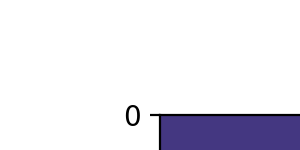

In [19]:
fig, ax = plt.subplots()
ax.imshow(all_weights.values, aspect = 'auto')

In [20]:
all_weights[[c for c in all_weights.columns if 'image0' in c]]

image0_-1  image0_-2  image0_-3  \
ophys_experiment_id cell_specimen_id                                    
853362773           1086516968         0.016673  -0.000895   0.000541   
                    1086514148         0.003911   0.001858   0.000966   
                    1086512261         0.021068   0.016399   0.001597   
                    1086513277         0.029265   0.026516   0.011491   
                    1086520006         0.008666   0.005250   0.000478   
...                                         ...        ...        ...   
974358973           1086563729         0.000039   0.000144   0.000119   
                    1086583717        -0.000144  -0.000180  -0.000158   
                    1086564436         0.000788   0.000123  -0.000053   
                    1086542307        -0.000132  -0.000142  -0.000126   
                    1086546132        -0.000456  -0.000634  -0.000539   

                                      image0_0  image0_1  image0_2  image0_3  \
ophys_experiment_id cell_specimen_id                                           
853362773           1086516968        0.029644  0.023979  0.011774  0.001302   
                    1086514148        0.004641  0.002187 -0.000251 -0.002088   
                    1086512261        0.041656  0.048785  0.028471  0.017784   
                    1086513277        0.040258  0.043965  0.050075  0.055072   
                    1086520006        0.008466  0.004130  0.000901 -0.000027   
...                                        ...       ...       ...       ...   
974358973           1086563729       -0.000062 -0.000185  0.000386  0.000653   
                    1086583717       -0.000146 -0.000440 -0.000779 -0.000647   
                    1086564436        0.001533  0.001126  0.000765  0.000297   
                    1086542307       -0.000231 -0.000429 -0.000693 -0.000720   
                    1086546132       -0.000821 -0.000713 -0.000811 -0.000960   

                                      image0_4  image0_5  
ophys_experiment_id cell_specimen_id                      
853362773           1086516968       -0.004842 -0.007677  
                    1086514148       -0.002760 -0.003570  
                    1086512261        0.010946  0.008947  
                    1086513277        0.040434  0.018957  
                    1086520006       -0.000956 -0.001510  
...                                        ...       ...  
974358973           1086563729        0.000484  0.000037  
                    1086583717       -0.000829 -0.000633  
                    1086564436        0.000165 -0.000036  
                    1086542307       -0.000593 -0.000371  
                    1086546132       -0.000901 -0.000546  

[31086 rows x 9 columns]

In [21]:
def reformat_col_name(col_name):
    kernel_name = col_name.split('_')[0]
    number = int(col_name.split('_')[1])
    return {'name':col_name, 'kernel_name':kernel_name, 'number':number}

# '{}_{:0>4d}'.format(cols[0].split('_')[0], int(cols[0].split('_')[1]))

In [22]:
cols = [c for c in all_weights.columns if 'image' in c or 'omissions_' in c]
cols_df = pd.DataFrame([reformat_col_name(col) for col in cols]).sort_values(by=['kernel_name','number']).reset_index(drop=True)
sorted_cols = cols_df['name'].values

In [23]:
cols_df['name_change'] = cols_df['kernel_name'] != cols_df['kernel_name'].shift()
cols_df

,name,kernel_name,number,name_change
0,image0_-3,image0,-3,True
1,image0_-2,image0,-2,False
2,image0_-1,image0,-1,False
3,image0_0,image0,0,False
4,image0_1,image0,1,False
...,...,...,...,...
95,omissions_23,omissions,23,False
96,omissions_24,omissions,24,False
97,omissions_25,omissions,25,False
98,omissions_26,omissions,26,False


In [24]:
all_weights_merged = all_weights.reset_index().merge(
    r[['ophys_experiment_id','session_type','cre_line']].drop_duplicates(),
    left_on = 'ophys_experiment_id',
    right_on = 'ophys_experiment_id',
)

In [25]:
def make_categorical(df, column):
    df['{}_categorical'.format(column)] = pd.Categorical(df[column], ordered=True).codes
    
for column in ['cre_line']:
    make_categorical(all_weights_merged, column)
    
all_weights_merged[['cre_line','cre_line_categorical']]

,cre_line,cre_line_categorical
0,Vip-IRES-Cre,2
1,Vip-IRES-Cre,2
2,Vip-IRES-Cre,2
3,Vip-IRES-Cre,2
4,Vip-IRES-Cre,2
...,...,...
31081,Slc17a7-IRES2-Cre,0
31082,Slc17a7-IRES2-Cre,0
31083,Slc17a7-IRES2-Cre,0
31084,Slc17a7-IRES2-Cre,0


<IPython.core.display.Javascript object>


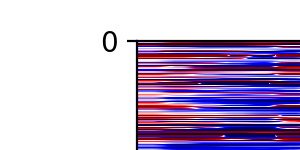

In [26]:
fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(all_weights_merged.sort_values(by='cre_line_categorical')[sorted_cols].values, aspect = 'auto',clim=[-0.001,0.001], cmap='seismic')
ax.set_xticks(cols_df.query('name_change').index)
ax.set_xticklabels(cols_df.query('name_change')['kernel_name'], rotation=30, ha='right')
fig.tight_layout()

In [27]:
from sklearn.manifold import TSNE

In [28]:
all_weights[sorted_cols]

image0_-3  image0_-2  image0_-1  \
ophys_experiment_id cell_specimen_id                                    
853362773           1086516968         0.000541  -0.000895   0.016673   
                    1086514148         0.000966   0.001858   0.003911   
                    1086512261         0.001597   0.016399   0.021068   
                    1086513277         0.011491   0.026516   0.029265   
                    1086520006         0.000478   0.005250   0.008666   
...                                         ...        ...        ...   
974358973           1086563729         0.000119   0.000144   0.000039   
                    1086583717        -0.000158  -0.000180  -0.000144   
                    1086564436        -0.000053   0.000123   0.000788   
                    1086542307        -0.000126  -0.000142  -0.000132   
                    1086546132        -0.000539  -0.000634  -0.000456   

                                      image0_0  image0_1  image0_2  image0_3  \
ophys_experiment_id cell_specimen_id                                           
853362773           1086516968        0.029644  0.023979  0.011774  0.001302   
                    1086514148        0.004641  0.002187 -0.000251 -0.002088   
                    1086512261        0.041656  0.048785  0.028471  0.017784   
                    1086513277        0.040258  0.043965  0.050075  0.055072   
                    1086520006        0.008466  0.004130  0.000901 -0.000027   
...                                        ...       ...       ...       ...   
974358973           1086563729       -0.000062 -0.000185  0.000386  0.000653   
                    1086583717       -0.000146 -0.000440 -0.000779 -0.000647   
                    1086564436        0.001533  0.001126  0.000765  0.000297   
                    1086542307       -0.000231 -0.000429 -0.000693 -0.000720   
                    1086546132       -0.000821 -0.000713 -0.000811 -0.000960   

                                      image0_4  image0_5  image1_-3  \
ophys_experiment_id cell_specimen_id                                  
853362773           1086516968       -0.004842 -0.007677  -0.005010   
                    1086514148       -0.002760 -0.003570  -0.002152   
                    1086512261        0.010946  0.008947  -0.006694   
                    1086513277        0.040434  0.018957  -0.003274   
                    1086520006       -0.000956 -0.001510   0.000923   
...                                        ...       ...        ...   
974358973           1086563729        0.000484  0.000037   0.000099   
                    1086583717       -0.000829 -0.000633  -0.000374   
                    1086564436        0.000165 -0.000036   0.000633   
                    1086542307       -0.000593 -0.000371  -0.000206   
                    1086546132       -0.000901 -0.000546   0.000399   

                                      image1_-2  image1_-1  image1_0  \
ophys_experiment_id cell_specimen_id                                   
853362773           1086516968        -0.009573  -0.005046  0.001439   
                    1086514148        -0.001363   0.002237  0.003620   
                    1086512261        -0.022164  -0.014084 -0.001272   
                    1086513277        -0.010628  -0.007630 -0.005802   
                    1086520006        -0.001239   0.001078  0.002944   
...                                         ...        ...       ...   
974358973           1086563729         0.000006  -0.000067 -0.000147   
                    1086583717        -0.001097  -0.001275 -0.000425   
                    1086564436         0.000120  -0.000512 -0.000436   
                    1086542307        -0.000313  -0.000223 -0.000289   
                    1086546132         0.000869   0.000340 -0.000216   

                                      image1_1  image1_2  image1_3  image1_4  \
ophys_experiment_id cell_specimen_id                                           
853362773           108651

In [29]:
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(all_weights_merged[sorted_cols].values)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 31086 samples in 0.002s...
[t-SNE] Computed neighbors for 31086 samples in 21.299s...
[t-SNE] Computed conditional probabilities for sample 1000 / 31086
[t-SNE] Computed conditional probabilities for sample 2000 / 31086
[t-SNE] Computed conditional probabilities for sample 3000 / 31086
[t-SNE] Computed conditional probabilities for sample 4000 / 31086
[t-SNE] Computed conditional probabilities for sample 5000 / 31086
[t-SNE] Computed conditional probabilities for sample 6000 / 31086
[t-SNE] Computed conditional probabilities for sample 7000 / 31086
[t-SNE] Computed conditional probabilities for sample 8000 / 31086
[t-SNE] Computed conditional probabilities for sample 9000 / 31086
[t-SNE] Computed conditional probabilities for sample 10000 / 31086
[t-SNE] Computed conditional probabilities for sample 11000 / 31086
[t-SNE] Computed conditional probabilities for sample 12000 / 31086
[t-SNE] Computed conditional probabilities for s

<IPython.core.display.Javascript object>


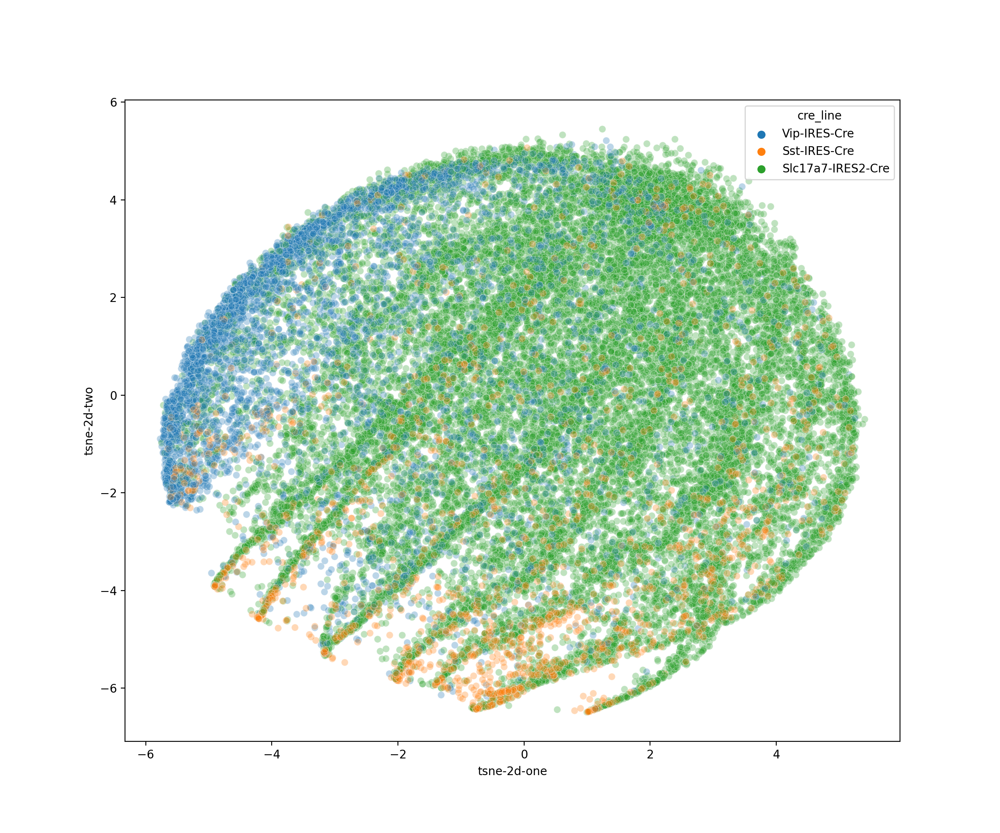

<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

In [32]:
all_weights_merged['tsne-2d-one'] = tsne_results[:,0]
all_weights_merged['tsne-2d-two'] = tsne_results[:,1]
plt.figure(figsize=(12,10))
sns.scatterplot(
    data=all_weights_merged,
    x="tsne-2d-one", 
    y="tsne-2d-two",
    legend="full",
    alpha=0.3,
    hue='cre_line'
)

<IPython.core.display.Javascript object>


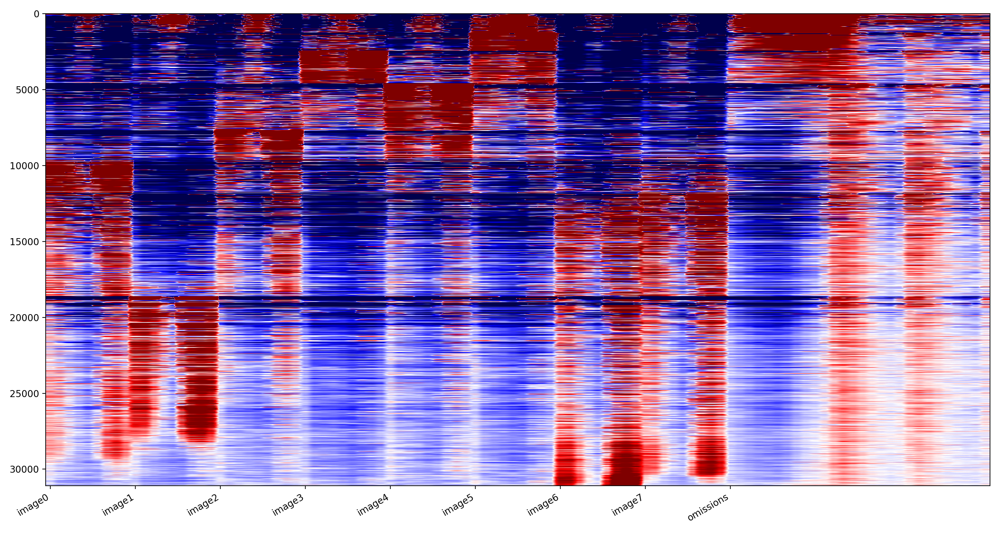

In [35]:
fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(
    all_weights_merged.sort_values(by = ["tsne-2d-one","tsne-2d-two"])[sorted_cols].values, 
    aspect = 'auto',
    clim=[-0.001,0.001], 
    cmap='seismic'
)
ax.set_xticks(cols_df.query('name_change').index)
ax.set_xticklabels(cols_df.query('name_change')['kernel_name'], rotation=30, ha='right')
fig.tight_layout()

In [36]:
# make sure there's a heatmap definition for every column, otherwise the column will plot without a heatmap!
additional_cols_to_plot = [
    'cre_line_categorical',
    "tsne-2d-one",
    "tsne-2d-two"
]
cols_to_plot = list(sorted_cols) + additional_cols_to_plot

heatmap_defs = [
    {
        'columns':list(sorted_cols),
        'cbar_label':'weights',
        'vmin':-0.001,
        'vmax':0.001,
        'cmap':'seismic',
    },
    {
        'columns':['cre_line_categorical'],
        'cbar_label':'cre_line',
        'cbar_ticks':[0,1,2],
        'cbar_ticklabels':np.sort(np.unique(all_weights_merged['cre_line'])),
        'vmin':-0.5,
        'vmax':2.5,
        'cmap':sns.color_palette("hls", 3),
    },
    {
        'columns':["tsne-2d-one","tsne-2d-two"],
        'cbar_label':'tsne',
        'vmin':-5,
        'vmax':5,
        'cmap':'seismic',
    },
]

<IPython.core.display.Javascript object>


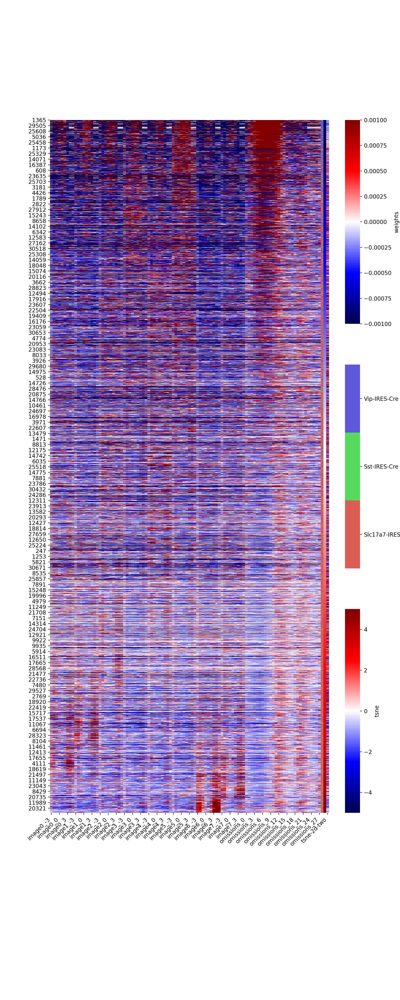

In [37]:
sort_by = [
    "tsne-2d-one",
    "tsne-2d-two",
]

data_to_plot = all_weights_merged[cols_to_plot].sort_values(by=sort_by)

fig, axes = vbp.make_multi_cmap_heatmap(
    data_to_plot, 
    heatmap_defs, 
    figsize=(10,25), 
    top_buffer=0, 
    bottom_buffer=0.1, 
    n_cbar_rows=3, 
    heatmap_div=0.9, 
)


In [38]:
%load_ext autoreload
%autoreload 2

In [39]:
import umap
from sklearn.preprocessing import StandardScaler

In [40]:
reducer = umap.UMAP()

In [41]:
scaled_data = StandardScaler().fit_transform(all_weights[sorted_cols].values)

In [42]:
embedding_scaled = reducer.fit_transform(scaled_data)
embedding_scaled.shape

embedding_unscaled = reducer.fit_transform(all_weights[sorted_cols].values)
embedding_unscaled.shape

(31086, 2)

<IPython.core.display.Javascript object>


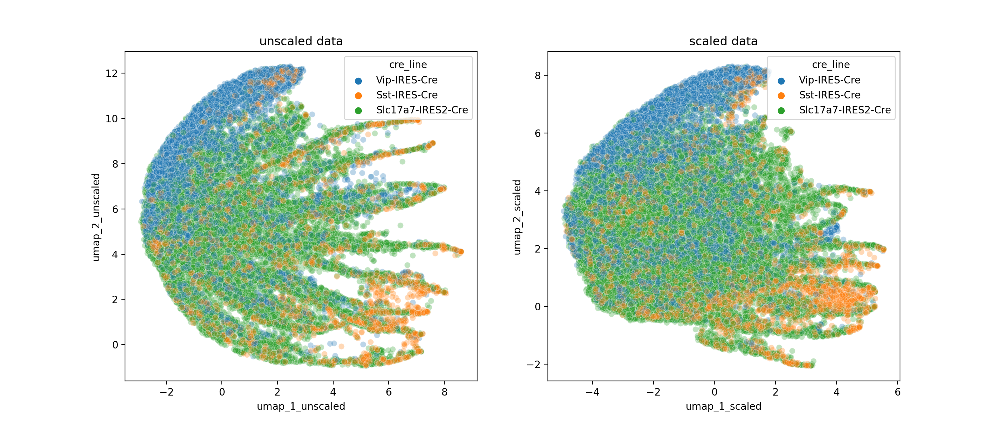

Text(0.5, 1.0, 'scaled data')

In [44]:
all_weights_merged['umap_1_scaled'] = embedding_scaled[:,0]
all_weights_merged['umap_2_scaled'] = embedding_scaled[:,1]
all_weights_merged['umap_1_unscaled'] = embedding_unscaled[:,0]
all_weights_merged['umap_2_unscaled'] = embedding_unscaled[:,1]


fig, ax = plt.subplots(1, 2, figsize=(14,6))
sns.scatterplot(
    data=all_weights_merged,
    x="umap_1_unscaled", 
    y="umap_2_unscaled",
    legend="full",
    alpha=0.3,
    hue='cre_line',
    ax = ax[0]
)
ax[0].set_title('unscaled data')

sns.scatterplot(
    data=all_weights_merged,
    x="umap_1_scaled", 
    y="umap_2_scaled",
    legend="full",
    alpha=0.3,
    hue='cre_line',
    ax = ax[1]
)
ax[1].set_title('scaled data')

<IPython.core.display.Javascript object>


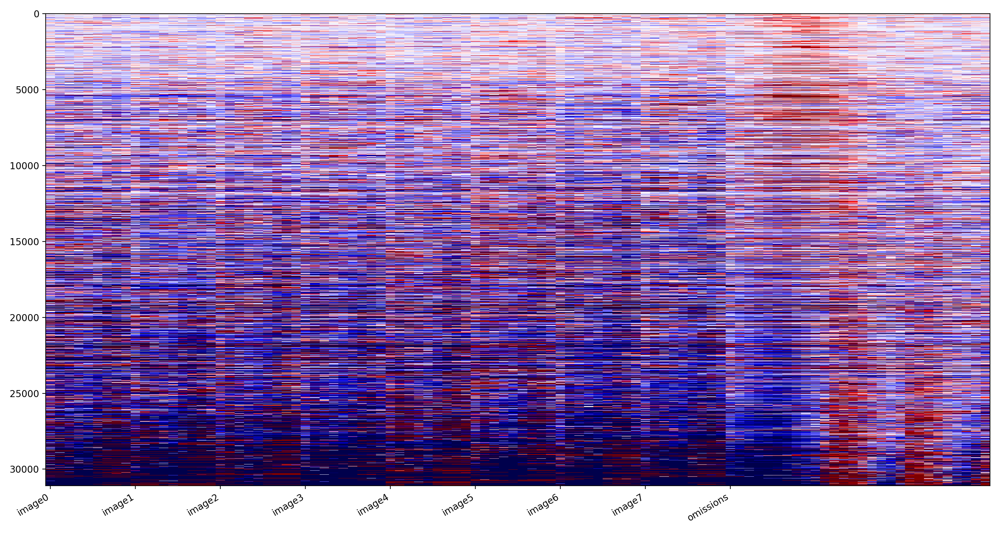

In [46]:
fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(
    all_weights_merged.sort_values(by = ["umap_1_unscaled"])[sorted_cols].values, 
    aspect = 'auto',
    clim=[-0.001,0.001], 
    cmap='seismic',
    interpolation='none'
)
ax.set_xticks(cols_df.query('name_change').index)
ax.set_xticklabels(cols_df.query('name_change')['kernel_name'], rotation=30, ha='right')
fig.tight_layout()

In [ ]:
import scipy.cluster.hierarchy as sch
from scipy.spatial import distance

In [ ]:
data_sample = all_weights[sorted_cols].sample(5000, replace=False, random_state=0)
corr_matr = data_sample.T.corr()


In [ ]:
# get pairwise distances for each correlation value
n_clusters = 9
pairwise_distances = sch.distance.pdist(corr_matr)

# perform heirarchical clustering 
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.linkage.html
linkage = sch.linkage(pairwise_distances, method='complete')
cluster_labels = sch.fcluster(linkage, n_clusters, criterion='maxclust')

# build a dataframe with a column containing cell_ids and another containing cluster labels
cluster_df = pd.DataFrame({
    'cell_id': corr_matr.columns.values, 
    'cluster_id': cluster_labels
})
sorted_columns = cluster_df.sort_values(by='cluster_id')['cell_id']

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(16,7), sharey=True)
ax[0].imshow(corr_matr, cmap='seismic',clim=(-1,1))
ax[1].imshow(corr_matr[sorted_columns].loc[sorted_columns], cmap='seismic',clim=(-1,1))

cluster_indices = (
    cluster_df
    .sort_values(by='cluster_id')
    .reset_index()
    .drop_duplicates(subset=['cluster_id'])
    .index
)
for cluster_start_index in cluster_indices:
    ax[1].axhline(cluster_start_index-0.5, color='green', alpha=0.5, linewidth=3)
    ax[1].axvline(cluster_start_index-0.5, color='green', alpha=0.5, linewidth=3)
    
ax[0].set_title('unsorted corr matrix')
ax[1].set_title('clustered corr matrix')

In [ ]:
fig, ax = plt.subplots(figsize=(15, 8))
ax.imshow(
    data_sample.loc[sorted_columns][sorted_cols].values, 
    aspect = 'auto',
    clim=[-0.001,0.001], 
    cmap='seismic',
#     interpolation='none'
)

for cluster_start_index in cluster_indices:
    ax.axhline(cluster_start_index-0.5, color='green', alpha=1, linewidth=3)
    
ax.set_xticks(cols_df.query('name_change').index)
ax.set_xticklabels(cols_df.query('name_change')['kernel_name'], rotation=30, ha='right')
fig.tight_layout()

In [ ]:
data_sample.loc[sorted_columns]